In [ ]:
import sys
import os

base_path = os.path.abspath('..')
sys.path.append(base_path)

In [ ]:
from dotenv import load_dotenv

load_dotenv()

In [8]:
import chart_studio
chart_studio.tools.set_credentials_file(username=os.environ.get("CHART_STUDIO_USERNAME"),
                                        api_key=os.environ.get("CHART_STUDIO_API_KEY"))

    
    CLIENT_ID = os.environ.get("CLIENT_ID")
    CLIENT_SECRET = os.environ.get("CLIENT_SECRET")
    REDIRECT_URI = os.environ.get("REDIRECT_URI")

import chart_studio.plotly as py
import chart_studio.tools as tls

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import chain

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.colors import n_colors
import plotly.figure_factory as ff
import scipy

import bar_chart_race as bcr

plt.style.use('bmh')
pd.options.display.max_columns=999

In [11]:
from src.data_download.cleaning import process_liked_songs

In [12]:
import warnings

warnings.filterwarnings("ignore", message="DataFrame is highly fragmented.", category=pd.errors.PerformanceWarning)

In [251]:
df = pd.read_csv(base_path + "/data/liked_songs_raw.csv")
df = process_liked_songs(df)
print(df.shape)
df.head()

(5770, 981)


,id,name,popularity,is_local,is_explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,date_added,year_added,month_added,month_index,day_of_week_added,day_of_week_index,time_added,duration_s,duration_min,album_id,album_name,album_popularity,album_release_date,album_release_date_precision,artist_id,artist_name,artist_popularity,2-step,abstract,abstract beats,abstract hip hop,acid house,acid jazz,acid rock,acid techno,acousmatic,acoustic blues,adult standards,african electronic,african percussion,afro house,afro psych,afro r&b,afro soul,afro-cuban percussion,afro-funk,afrobeat,afrobeat brasileiro,afrobeat fusion,afrobeats,afrofuturism,afrofuturismo brasileiro,afropop,afroswing,alabama indie,alabama rap,album rock,alternative,alternative americana,alternative dance,alternative hip hop,alternative metal,alternative pop rock,alternative r&b,alternative rock,ambient,ambient country,ambient house,ambient idm,ambient pop,ambient techno,american contemporary classical,arab alternative,arab groove,arabic hip hop,argentine rock,arkansas country,armenian hip hop,art pop,art punk,art rock,atl hip hop,atl trap,auckland indie,aussie drill,aussietronica,australian alternative rock,australian ambient,australian dance,australian electropop,australian experimental,australian hip hop,australian house,australian indie,australian indie rock,australian pop,australian psych,australian r&b,australian reggae fusion,australian rock,australian surf rock,australian trap,austrian dnb,avant-garde jazz,azonto,azontobeats,balearic,barbadian pop,bardcore,baroque pop,bass house,bass trap,bass trip,bath indie,bay area indie,bboy,beach music,beatlesque,bebop,bedroom pop,bedroom soul,belgian edm,belgian hip hop,belgian pop,belly dance,benga,berlin school,big beat,birmingham grime,birmingham hip hop,birmingham indie,birmingham metal,black comedy,black punk,bleep techno,blues,blues rock,bmore,bolero,boogaloo,boogie,boom bap,boom bap espanol,bossa nova,bossa nova jazz,boston hip hop,boston rock,boy band,braindance,brass band,brass band pop,brazilian boogie,brazilian jazz,brazilian soul,breakbeat,breaks,brill building pop,bristol electronic,brit funk,british alternative rock,british blues,british comedy,british dance band,british experimental,british invasion,british jazz,british math rock,british singer-songwriter,british soul,britpop,broken beat,bronx hip hop,brooklyn drill,brooklyn indie,brostep,bubble trance,bubblegum pop,buffalo hip hop,bulgarian electronic,cali rap,calypso,cambodian rock,canadian americana,canadian comedy,canadian contemporary country,canadian contemporary r&b,canadian country,canadian electronic,canadian electropop,canadian hip hop,canadian house,canadian indigenous hip hop,canadian indigenous music,canadian latin,canadian modern jazz,canadian pop,canadian singer-songwriter,canadian trap,candy pop,canterbury scene,canzone d'autore,cascadia psych,chamber pop,chamber psych,channel islands indie,chanson,chicago blues,chicago bop,chicago drill,chicago house,chicago rap,chicago soul,chicha,chill abstract hip hop,chill baile,chill drill,chill r&b,chillhop,chillwave,chimurenga,cincinnati rap,city pop,classic afrobeat,classic bollywood,classic canadian rock,classic city pop,classic country pop,classic dubstep,classic garage rock,classic girl group,classic house,classic italian pop,classic japanese jazz,classic polish pop,classic portuguese pop,classic progressive house,classic rock,classic soul,classic turkish pop,classic uk pop,classical,cloud rap,collage pop,colombian pop,comedy,complextro,compositional ambient,conscious hip hop,contemporary classical,contemporary country,contemporary jazz,contemporary post-bop,contemporary r&b,cool jazz,cosmic american,country,country dawn,country rock,crank wave,cumbia funk,dance pop,dance rock,dance-punk,dancefloor dnb,dancehall,dancehall queen,danish electronic,danish indie pop,danish modern jazz,danish techno,dark disco,dark plugg,dark techno,dark trap,dec

In [256]:
pd.options.display.max_columns=14
df.head()

,id,name,popularity,is_local,is_explicit,danceability,energy,...,ye ye,yodeling,yugoslav rock,zambian hip hop,zilizopendwa,zim urban groove,zolo
0,5gciWzZRdQHiWkyBaHPSdB,Kanou Dan Yen,35,False,False,0.763,0.451,...,0,0,0,0,0,0,0
1,0Ty1I0eAkYpSGd7MJWXM2n,Gentle Persuasion,27,False,False,0.594,0.635,...,0,0,0,0,0,0,0
2,1YN3aermJfsy53lU90Nssf,Life's Gone Down Low,40,False,False,0.607,0.428,...,0,0,0,0,0,0,0
3,6BkeuHmO4P69Ln2BSonrXi,Jumpin' Jack Flash,40,False,False,0.523,0.722,...,0,0,0,0,0,0,0
4,2YfRKF4sWeV1t1NqBoUgxH,Anchin Kfu Ayinkash,51,False,False,0.471,0.551,...,0,0,0,0,0,0,0


In [16]:
n_tracks = df.shape[0]
n_tracks

5770

# 1. When were songs added?

Get the cumulative total of saved tracks by date.

In [72]:
data = df['date_added'].value_counts().reset_index().sort_values(by='date_added').rename(columns={'count':'new_tracks'})
data['total_tracks'] = data['new_tracks'].cumsum()
data.head()

,date_added,new_tracks,total_tracks
477,2016-02-17,4,4
947,2016-02-18,1,5
101,2016-02-19,11,16
134,2016-02-20,9,25
222,2016-02-21,7,32


The `plotly_express.line()` function plots a line chart of the data. We can hover over individual points to inspect the value for a given date. 

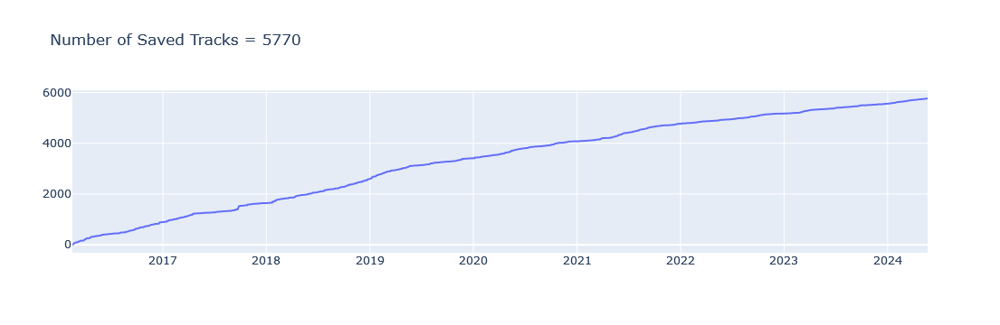

In [73]:
fig = px.line(
    data,
    x='date_added',
    y='total_tracks',
    title=f"Number of Saved Tracks = {data['total_tracks'].max()}")

fig.update_layout(
    xaxis_title='',
    yaxis_title=''
)

fig.write_html(base_path + '/figures/saved_tracks_cumulative_line.html')
py.plot(fig, filename="saved_tracks_cumulative_line", auto_open=True)
fig.show()

In [257]:
data = df['year_added'].value_counts().reset_index().sort_values(by='year_added')
data

,year_added,count
1,2016,893
3,2017,748
0,2018,956
2,2019,812
5,2020,669
4,2021,693
6,2022,402
7,2023,383
8,2024,214


The `plotly_express.bar()` function plots a line chart of the data. We can hover over individual bars to inspect the value for a given year. 

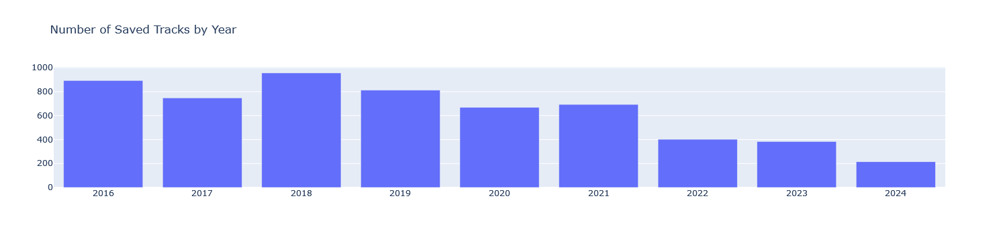

In [75]:
fig = px.bar(
    data,
    x='year_added',
    y='count',
    title='Number of Saved Tracks by Year'
)
fig.update_layout(
    xaxis_title='',
    yaxis_title=''
)
fig.write_html(base_path + '/figures/saved_tracks_by_year_bar.html')
py.plot(fig, filename="saved_tracks_by_year_bar", auto_open=True)
fig.show()

I was most active in 2018, saving 956 songs. This number more than halved by 2022 when only 402 songs were added. The 2024 count is smallest as the data is taken from May 2024.

In [77]:
data = df[['month_added', 'month_index']].value_counts().reset_index().sort_values(by='month_index')
data['%'] = round(100 * (data['count'] / n_tracks), 2)
data.head()

,month_added,month_index,count,%
5,January,1,506,8.77
4,February,2,512,8.87
0,March,3,629,10.90
2,April,4,575,9.97
3,May,5,537,9.31


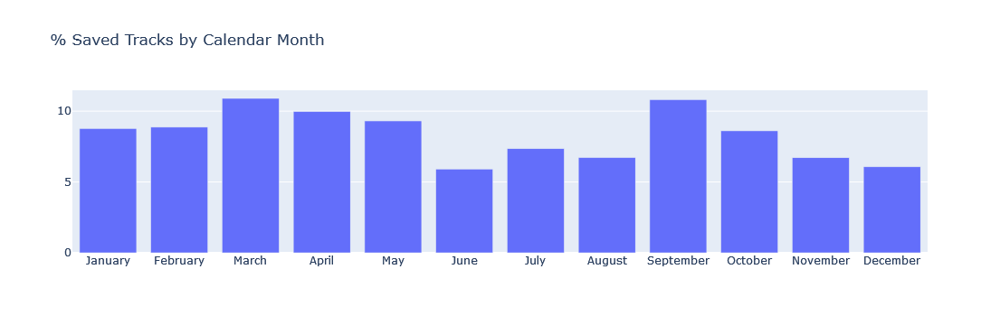

In [78]:
fig = px.bar(data, x='month_added', y='%', title='% Saved Tracks by Calendar Month')
fig.update_layout(
    xaxis_title='',
    yaxis_title=''
)
fig.write_html(base_path + '/figures/saved_tracks_by_month_bar.html')
py.plot(fig, filename="saved_tracks_by_month_bar", auto_open=True)
fig.show()

Almost 22% of my library tracks have been added in March and September (11% each). There seems to be a bit of a dip in activity in the summer months (around 6-7% of all tracks), similarly in November and December.

In [258]:
data = df[['day_of_week_added', 'day_of_week_index']].value_counts().reset_index().sort_values(by='day_of_week_index')
data['%'] = round(100 * (data['count'] / n_tracks), 2)
data

,day_of_week_added,day_of_week_index,count,%
0,Monday,0,1219,21.13
1,Tuesday,1,1157,20.05
3,Wednesday,2,842,14.59
2,Thursday,3,857,14.85
4,Friday,4,717,12.43
6,Saturday,5,463,8.02
5,Sunday,6,515,8.93


In [80]:
fig = px.bar(
    data, x='day_of_week_added',
    y='%',
    title='Saved Tracks by Day of Week (%)'
)
fig.update_layout(
    xaxis_title='',
    yaxis_title=''
)
fig.write_html(base_path + '/figures/saved_tracks_by_dayofweek_bar.html')
py.plot(fig, filename="saved_tracks_by_dayofweek_bar", auto_open=True)
fig.show()

41% of my liked songs were added on Monday or Tuesday. This is likely due to the Discover Weekly playlist being updated on Mondays.

We can use the `plotly.figure_factory()` function to visualise the distribution of saved tracks by time of day. The plot produces a histogram and kde plot.

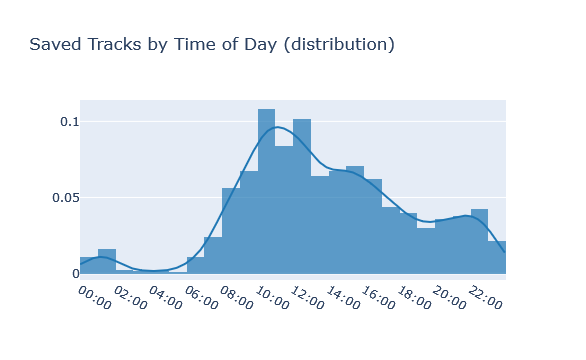

In [82]:
data = df['time_added'].values
data = [[d.hour + (d.minute/60) + (d.second/3600) for d in data]]
group_labels = ['time']

fig = ff.create_distplot(data, group_labels, bin_size=1, show_hist=True, curve_type='kde', show_rug=False)

fig.update_xaxes(
    range=[0, 24],
    tickvals=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22],
    ticktext=['00:00','02:00','04:00','06:00','08:00','10:00','12:00','14:00','16:00','18:00','20:00','22:00']
)

fig.update_layout(
    title_text='Saved Tracks by Time of Day (distribution)',
    showlegend=False)

for trace in fig.data:
    trace.hoverinfo = 'none'

fig.write_html(base_path + '/figures/saved_tracks_by_timeofday_dist.html')
py.plot(fig, filename="saved_tracks_by_timeofday_dist", auto_open=True)
fig.show()

Peak activity lies between 10am and 1pm.

# 2. Decades

Extract the release decade from the album release date.

In [259]:
df[['album_release_date', 'album_release_date_precision']].head()

,album_release_date,album_release_date_precision
0,2018-05-25,day
1,2015-10-16,day
2,1976-01-01,day
3,1970,year
4,2016-06-17,day


In [260]:
df['album_release_year'] = df['album_release_date'].apply(lambda x: x[:4])
df['decade'] = ((df['album_release_year'].astype('int') // 10) * 10).astype('string')
df['decade'] = df['decade'].apply(lambda x: 'Unknown' if x == '0' else x)
df['decade'].head()

0    2010
1    2010
2    1970
3    1970
4    2010
Name: decade, dtype: object

`get_cumulative_stats` generates the cumulative song counts (and % of cumulative total) for a given column. In this case we are grouping by `decade`.

In [261]:
def get_cumulative_stats(data, column):
    # groupby column and get cumulative sum
    groupby_counts = data.groupby(['date_added', column])['id'].count().reset_index().rename(columns={'id':'saved'}).sort_values(by='date_added')
    groupby_counts['cum_saved'] = groupby_counts.groupby(column)['saved'].cumsum()
    
    # Create a DataFrame to cover all dates for each name
    all_dates = pd.date_range(start=groupby_counts['date_added'].min(), end=groupby_counts['date_added'].max(), freq='D')
    all_names = groupby_counts[column].unique()
    idx = pd.MultiIndex.from_product([all_dates, all_names], names=['date_added', column])
    names_dates_cross_join = pd.DataFrame(index=idx).reset_index()
    
    # merge all dates with counts dataframe
    groupby_counts['date_added'] = pd.to_datetime(groupby_counts['date_added'])
    names_dates_cross_join['date_added'] = pd.to_datetime(names_dates_cross_join['date_added'])
    
    stats_all_dates = pd.merge(names_dates_cross_join, groupby_counts, on=['date_added', column], how='left')
    stats_all_dates['saved'] = stats_all_dates['saved'].fillna(0)
    
    stats_all_dates['cum_saved'] = stats_all_dates.groupby(column)['saved'].cumsum().astype('int')
    stats_all_dates = stats_all_dates.sort_values(by=['date_added', 'cum_saved', 'saved'], ascending=[True, False, True])  
    
    # get as % of total
    pivoted = stats_all_dates.pivot(index='date_added', columns=column, values='cum_saved')
    pivoted = pivoted.fillna(0.0)
    
    pivoted_pct = pivoted.div(pivoted.sum(axis=1), axis=0) * 100
    pivoted_pct.head()
    
    # convert to long df
    long = pivoted.reset_index().melt(id_vars=['date_added'], var_name=column, value_name='cum_saved')
    long_pct = pivoted_pct.reset_index().melt(id_vars=['date_added'], var_name=column, value_name='%')
    
    # merge % and totals and return final df
    long_df = pd.merge(long, long_pct, on=['date_added', column])

    return long_df

In [262]:
data = df[df['decade']!='Unknown']
column = 'decade'

long_df = get_cumulative_stats(data, column)
long_df.head()

,date_added,decade,cum_saved,%
0,2016-02-17,1950,0,0.0
1,2016-02-18,1950,0,0.0
2,2016-02-19,1950,0,0.0
3,2016-02-20,1950,0,0.0
4,2016-02-21,1950,0,0.0


In [264]:
long_df[long_df['decade']=='2010'].head()

,date_added,decade,cum_saved,%
18102,2016-02-17,2010,1,25.0
18103,2016-02-18,2010,2,40.0
18104,2016-02-19,2010,10,62.5
18105,2016-02-20,2010,14,56.0
18106,2016-02-21,2010,16,50.0


We will visualise cumulative saved tracks by decade over time using `plotly_express.area()`, first as a proportion of the total, then as a simple count.

For the percentage chart, taking a vertical cross section shows the proportion of saved tracks by decade on a given date.

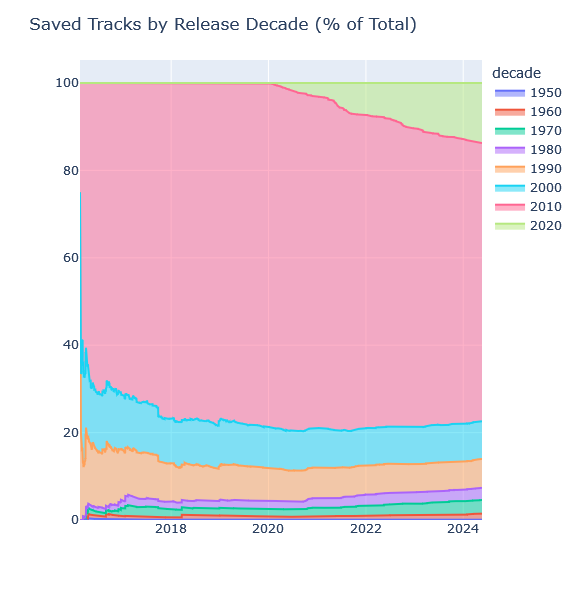

In [250]:
fig = px.area(long_df, x="date_added", y="%", color="decade", line_group=None)

fig.update_layout(
    title='Saved Tracks by Release Decade (% of Total)',
    xaxis_title='',
    yaxis_title='',
    showlegend=True,
    height=600,
    width=1000
)
fig.write_html(base_path + '/figures/saved_tracks_by_decade_pct_area.html')
#py.plot(fig, filename="saved_tracks_by_decade_pct_area", auto_open=True)
fig.show()

For the count chart, the area of of each filled section corresponds to the cumulative count of saved tracks for the given decade.

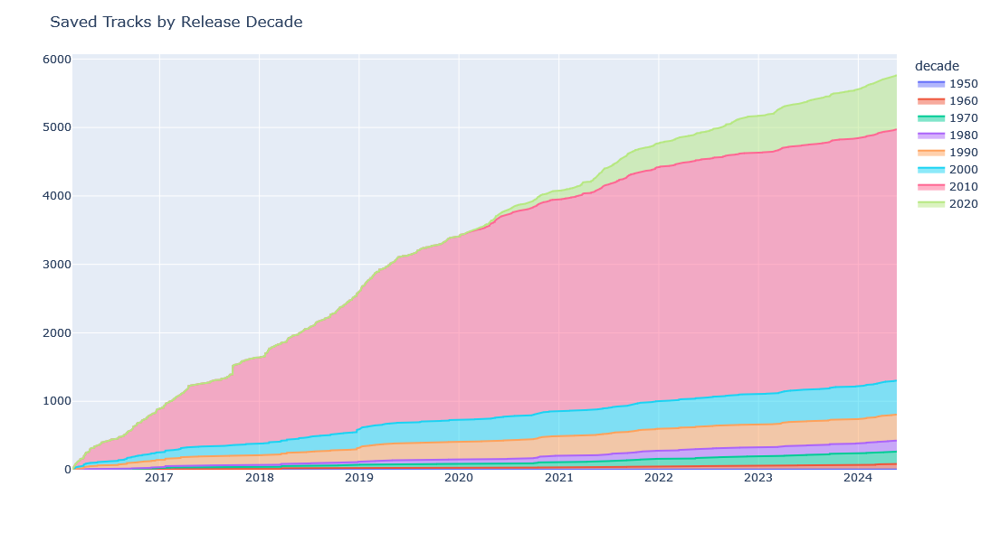

In [90]:
fig = px.area(long_df, x="date_added", y="cum_saved", color="decade", line_group=None)

fig.update_layout(
    title='Saved Tracks by Release Decade',
    xaxis_title='',
    yaxis_title='',
    showlegend=True,
    height=600,
    width=1000
)

fig.write_html(base_path + '/figures/saved_tracks_by_decade_area.html')
#py.plot(fig, filename="saved_tracks_by_decade_area", auto_open=True)
fig.show()

Most of my saved tracks are from the 2010's. The proportion of tracks from the 2020's has been on the rise (since 2020, obviously) and is still increasing.

We will use the `bar_chart_race` library to visualise how the number of cumulative saved tracks change by decade, by plotting a bar chart for each month, and save the animation as an mp4 file.

In [91]:
def get_bcr_df(df, name):
    df_bcr = df.copy()
    
    # keep values for end of month only
    months = pd.date_range(start=df_bcr['date_added'].min(), end=df_bcr['date_added'].max(), freq='ME')
    df_bcr = df_bcr[df_bcr['date_added'].isin(months)]
    
    df_bcr = df_bcr.pivot_table(index='date_added', columns=name, values='cum_saved')
    df_bcr = df_bcr.fillna(0)

    return df_bcr

In [92]:
decades_bcr = get_bcr_df(long_df, name='decade')
decades_bcr.head()

decade,1950,1960,1970,1980,1990,2000,2010,2020
date_added,,,,,,,,
2016-02-29,0.0,0.0,0.0,0.0,15.0,20.0,52.0,0.0
2016-03-31,0.0,1.0,0.0,1.0,37.0,38.0,125.0,0.0
2016-04-30,1.0,3.0,4.0,3.0,45.0,45.0,217.0,0.0
2016-05-31,1.0,3.0,4.0,4.0,53.0,53.0,265.0,0.0
2016-06-30,1.0,3.0,4.0,4.0,54.0,57.0,304.0,0.0


In [93]:
def plot_bar_chart_race(df, filename, n_bars, title):
    bcr.bar_chart_race(
        df=df,
        filename=filename,
        orientation='h',
        sort='desc',
        n_bars=n_bars,
        fixed_order=False,
        fixed_max=True,
        interpolate_period=False,
        label_bars=True,
        bar_size=.95,
        period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
        period_fmt='%B, %Y',
        figsize=(5, 3),
        dpi=144,
        cmap='dark12',
        title=title,
        title_size='',
        bar_label_size=7,
        tick_label_size=7,
        scale='linear',
        writer=None,
        fig=None,
        bar_kwargs={'alpha': .7},
        filter_column_colors=True
    )  

In [ ]:
plot_bar_chart_race(
    df=decades_bcr,
    filename=base_path + '/figures/decades_bcr.mp4',
    n_bars=8,
    title='Saved Tracks by Decade'
)

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:286: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:287: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



I've taken snapshots from the animation to demonstrate what this looks like. The bar chart races in the artist and genre sections will look similar.

In [94]:
from PIL import Image 
from IPython.display import display

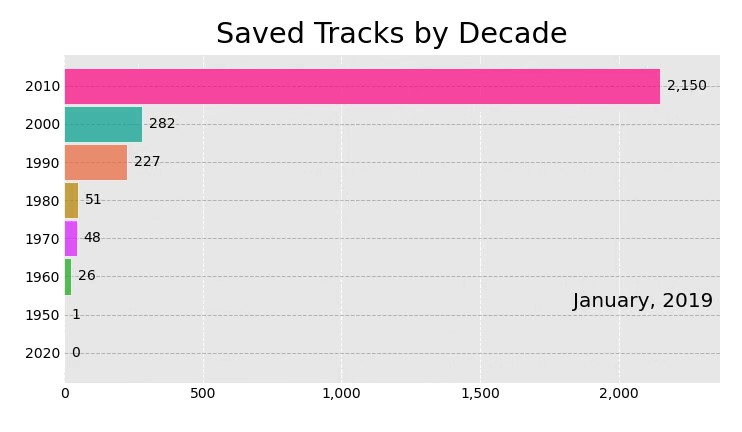

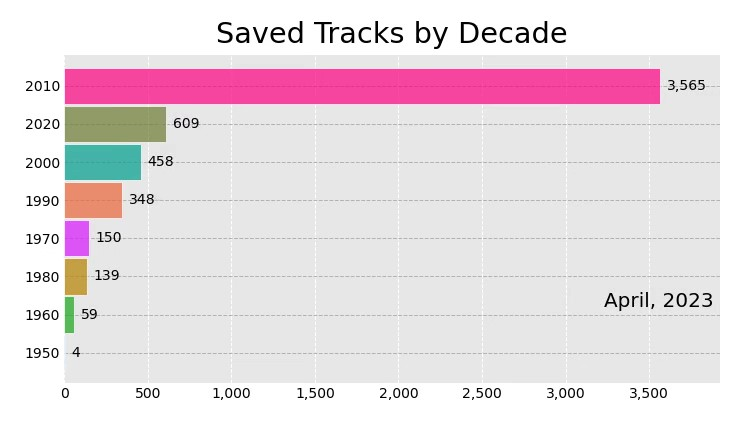

In [95]:
img1 = Image.open(base_path + '/figures/decades_bcr_snapshot_1.jpg')
img2 = Image.open(base_path + '/figures/decades_bcr_snapshot_2.jpg')
display(img1)
display(img2)

# 3. Explicit

In [96]:
# get counts of explicit songs and total saved songs by year
explicit = df.groupby('year_added')['is_explicit'].sum().reset_index()
total = df.groupby('year_added')['id'].nunique().reset_index().rename(columns={'id':'total'})

# for each year calculate the % of explicit tracks and non-explicit tracks added that year
explicit = pd.merge(explicit, total, on='year_added')
explicit['Yes (%)'] = round(100*(explicit['is_explicit']/explicit['total']), 2)
explicit['No (%)'] = 100.0 - explicit['Yes (%)']
explicit

,year_added,is_explicit,total,Yes (%),No (%)
0,2016,412,893,46.14,53.86
1,2017,331,748,44.25,55.75
2,2018,301,956,31.49,68.51
3,2019,288,812,35.47,64.53
4,2020,334,669,49.93,50.07
5,2021,170,693,24.53,75.47
6,2022,45,402,11.19,88.81
7,2023,36,383,9.40,90.60
8,2024,10,214,4.67,95.33


We can create a stacked bar plot by passing a list of column names in the `y` parameter to  `plotly_express.bar()`.

In [97]:
fig = px.bar(explicit, x="year_added", y=["Yes (%)", "No (%)"], title="Explicit Tracks Saved (%)")
fig.update_layout(legend_title_text='Explicit?',xaxis_title='',yaxis_title='')
fig.write_html(base_path + '/figures/explicit_bar.html')
py.plot(fig, filename="explicit_bar", auto_open=True)
fig.show()

# 4. Genres

Genres are structured differently to the other columns in our dataframe, as there is one column for every genre. To run our analysis, we'll create a long table where each row corresponds to a `1` label in a the genre column. For example, if a song added on 2022-01-01 had two genres - 2-step and hip-hop, our long table would convert this into two rows like so:
- row 1: `date_added` = 2022-01-01; `genre` = 2-step
- row 2: `date_added` = 2022-01-01; `genre` = hip-hop

In [98]:
non_genre_cols = [
 'id',
 'name',
 'popularity',
 'is_local',
 'is_explicit',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'date_added',
 'year_added',
 'month_added',
 'month_index',
 'day_of_week_added',
 'day_of_week_index',
 'time_added',
 'duration_s',
 'duration_min',
 'album_id',
 'album_name',
 'album_popularity',
 'album_release_date',
 'album_release_date_precision',
 'artist_id',
 'artist_name',
 'artist_popularity',
 'decade',
 'album_release_year'
]

In [99]:
genres = [col for col in df.drop(columns=non_genre_cols)]

In [100]:
genre_df = pd.melt(df, id_vars=['id', 'date_added'], value_vars=genres, var_name='genre', value_name='is_genre')
genre_df = genre_df[genre_df['is_genre'] == 1]
genre_df = genre_df.drop(columns=['is_genre'])
genre_df = genre_df.reset_index(drop=True)

genre_df.head()

,id,date_added,genre
0,44Y6mA4opzDud7gnurHavU,2018-12-31,2-step
1,2Sb5XUPtnLNFb7vkuP0mEa,2018-10-30,2-step
2,686HRftCfiFaLfitodtEsx,2018-10-22,2-step
3,7c8RMe4a29gUgMny30CNG8,2017-03-12,2-step
4,2va1wxQAeJ0oGAN0mPD96f,2016-03-17,2-step


Now the steps to create the bar chart race visualisation are the same as for the decades column.

In [101]:
long_df = get_cumulative_stats(data=genre_df, column='genre')
long_df.head()

,date_added,genre,cum_saved,%
0,2016-02-17,2-step,0,0.0
1,2016-02-18,2-step,0,0.0
2,2016-02-19,2-step,0,0.0
3,2016-02-20,2-step,0,0.0
4,2016-02-21,2-step,0,0.0


In [32]:
genres_bcr = get_bcr_df(long_df, name='genre')
genres_bcr.head()

plot_bar_chart_race(
    df=genres_bcr,
    filename=base_path + '/figures/genres_bcr.mp4',
    n_bars=8,
    title='Saved Tracks by Genre'
)

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 127 () missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 128 (\x80) missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 129 (\x81) missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 130 (\x82) missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/

Some of these genres are quite specific. We may wish to group things like 'conscious hip hop', 'rap' and 'hip hop' together. There are several ways we could go about this. One would be to manually group genres together. Another would be to use regex and string matching e.g. group every genre that contains the word 'Japanese' together under a new genre called 'Japanese music'.

I've opted for a different approach whereby I've chosen 6 popular genres which are prevalent in my music library - pop, rock, hip hop, r&b, electronic and alternative - and will assign each song to one of these 'main genres' or an 'other' category. 

In [102]:
main_genres = ['pop', 'rock', 'hip hop', 'r&b', 'electronic', 'alternative']

In [103]:
genre_counts = df[genres].sum()
genre_counts.sort_values().tail()

soul            933
pop             964
alternative    1142
rap            1194
hip hop        1969
dtype: int64

I've created a dataframe which shows the correlations between two genres by calculating the proportion of times they appear together in one track. For example if there are 10 tracks with the abstract genre and 8 of them also have hip hop as one of their genres then the correlation between abstract and hip hop will be 0.8.
I'm only interested in the correlation one way - "of all the abstract songs, how many are also hip hop?"

Since the genres are determined by the artist and not the track (remember the Spotify API returned 'artist genres') I've added this line of code `drop_duplicates(subset='artist_name')` to only have one row per artist. This is to prevent exaggerating the correlation strength. For example, if Kendrick Lamar was the only artist listed as both abstract and hip hop and I had 50 of his tracks saved, this would artificially increase the correlation between these two genres.

In [104]:
genres_only = df.drop_duplicates(subset='artist_name').drop(columns=non_genre_cols)

genre_correlations = pd.DataFrame(genres_only.sum().index).rename(columns={0:'genre'})
for genre in genres:
    d = genres_only[genres_only[genre]==1]
    sums = d.sum()
    total = sums[genre]
    
    sums = pd.DataFrame(sums).reset_index().rename(columns={'index':'genre', 0:genre})
    genre_correlations[f'{genre}'] = sums[genre] / total
    
genre_correlations.head()

,genre,2-step,abstract,abstract beats,abstract hip hop,acid house,acid jazz,acid rock,acid techno,acousmatic,acoustic blues,adult standards,african electronic,african percussion,afro house,afro psych,afro r&b,afro soul,afro-cuban percussion,afro-funk,afrobeat,afrobeat brasileiro,afrobeat fusion,afrobeats,afrofuturism,afrofuturismo brasileiro,afropop,afroswing,alabama indie,alabama rap,album rock,alternative,alternative americana,alternative dance,alternative hip hop,alternative metal,alternative pop rock,alternative r&b,alternative rock,ambient,ambient country,ambient house,ambient idm,ambient pop,ambient techno,american contemporary classical,arab alternative,arab groove,arabic hip hop,argentine rock,arkansas country,armenian hip hop,art pop,art punk,art rock,atl hip hop,atl trap,auckland indie,aussie drill,aussietronica,australian alternative rock,australian ambient,australian dance,australian electropop,australian experimental,australian hip hop,australian house,australian indie,australian indie rock,australian pop,australian psych,australian r&b,australian reggae fusion,australian rock,australian surf rock,australian trap,austrian dnb,avant-garde jazz,azonto,azontobeats,balearic,barbadian pop,bardcore,baroque pop,bass house,bass trap,bass trip,bath indie,bay area indie,bboy,beach music,beatlesque,bebop,bedroom pop,bedroom soul,belgian edm,belgian hip hop,belgian pop,belly dance,benga,berlin school,big beat,birmingham grime,birmingham hip hop,birmingham indie,birmingham metal,black comedy,black punk,bleep techno,blues,blues rock,bmore,bolero,boogaloo,boogie,boom bap,boom bap espanol,bossa nova,bossa nova jazz,boston hip hop,boston rock,boy band,braindance,brass band,brass band pop,brazilian boogie,brazilian jazz,brazilian soul,breakbeat,breaks,brill building pop,bristol electronic,brit funk,british alternative rock,british blues,british comedy,british dance band,british experimental,british invasion,british jazz,british math rock,british singer-songwriter,british soul,britpop,broken beat,bronx hip hop,brooklyn drill,brooklyn indie,brostep,bubble trance,bubblegum pop,buffalo hip hop,bulgarian electronic,cali rap,calypso,cambodian rock,canadian americana,canadian comedy,canadian contemporary country,canadian contemporary r&b,canadian country,canadian electronic,canadian electropop,canadian hip hop,canadian house,canadian indigenous hip hop,canadian indigenous music,canadian latin,canadian modern jazz,canadian pop,canadian singer-songwriter,canadian trap,candy pop,canterbury scene,canzone d'autore,cascadia psych,chamber pop,chamber psych,channel islands indie,chanson,chicago blues,chicago bop,chicago drill,chicago house,chicago rap,chicago soul,chicha,chill abstract hip hop,chill baile,chill drill,chill r&b,chillhop,chillwave,chimurenga,cincinnati rap,city pop,classic afrobeat,classic bollywood,classic canadian rock,classic city pop,classic country pop,classic dubstep,classic garage rock,classic girl group,classic house,classic italian pop,classic japanese jazz,classic polish pop,classic portuguese pop,classic progressive house,classic rock,classic soul,classic turkish pop,classic uk pop,classical,cloud rap,collage pop,colombian pop,comedy,complextro,compositional ambient,conscious hip hop,contemporary classical,contemporary country,contemporary jazz,contemporary post-bop,contemporary r&b,cool jazz,cosmic american,country,country dawn,country rock,crank wave,cumbia funk,dance pop,dance rock,dance-punk,dancefloor dnb,dancehall,dancehall queen,danish electronic,danish indie pop,danish modern jazz,danish techno,dark disco,dark plugg,dark techno,dark trap,deconstructed club,deep disco,deep disco house,deep euro house,deep funk,deep funk house,deep house,deep idm,deep liquid bass,deep minimal techno,deep soul house,deep tech house,deep techno,deep underground hip hop,delta blues,denton tx indie,desert blues,destroy techno,detroit hip hop,detroit house,detroit rock,detroit techno,dfw rap,dirty south rap,disco,disco house,diva house,

Reading down the column: of all the entries containing this genre, what proportion of other entries also contain the genre in the row?

In [105]:
genre_correlations = genre_correlations[genre_correlations['genre'].isin(main_genres)].set_index('genre')
genre_correlations

,2-step,abstract,abstract beats,abstract hip hop,acid house,acid jazz,acid rock,acid techno,acousmatic,acoustic blues,adult standards,african electronic,african percussion,afro house,afro psych,afro r&b,afro soul,afro-cuban percussion,afro-funk,afrobeat,afrobeat brasileiro,afrobeat fusion,afrobeats,afrofuturism,afrofuturismo brasileiro,afropop,afroswing,alabama indie,alabama rap,album rock,alternative,alternative americana,alternative dance,alternative hip hop,alternative metal,alternative pop rock,alternative r&b,alternative rock,ambient,ambient country,ambient house,ambient idm,ambient pop,ambient techno,american contemporary classical,arab alternative,arab groove,arabic hip hop,argentine rock,arkansas country,armenian hip hop,art pop,art punk,art rock,atl hip hop,atl trap,auckland indie,aussie drill,aussietronica,australian alternative rock,australian ambient,australian dance,australian electropop,australian experimental,australian hip hop,australian house,australian indie,australian indie rock,australian pop,australian psych,australian r&b,australian reggae fusion,australian rock,australian surf rock,australian trap,austrian dnb,avant-garde jazz,azonto,azontobeats,balearic,barbadian pop,bardcore,baroque pop,bass house,bass trap,bass trip,bath indie,bay area indie,bboy,beach music,beatlesque,bebop,bedroom pop,bedroom soul,belgian edm,belgian hip hop,belgian pop,belly dance,benga,berlin school,big beat,birmingham grime,birmingham hip hop,birmingham indie,birmingham metal,black comedy,black punk,bleep techno,blues,blues rock,bmore,bolero,boogaloo,boogie,boom bap,boom bap espanol,bossa nova,bossa nova jazz,boston hip hop,boston rock,boy band,braindance,brass band,brass band pop,brazilian boogie,brazilian jazz,brazilian soul,breakbeat,breaks,brill building pop,bristol electronic,brit funk,british alternative rock,british blues,british comedy,british dance band,british experimental,british invasion,british jazz,british math rock,british singer-songwriter,british soul,britpop,broken beat,bronx hip hop,brooklyn drill,brooklyn indie,brostep,bubble trance,bubblegum pop,buffalo hip hop,bulgarian electronic,cali rap,calypso,cambodian rock,canadian americana,canadian comedy,canadian contemporary country,canadian contemporary r&b,canadian country,canadian electronic,canadian electropop,canadian hip hop,canadian house,canadian indigenous hip hop,canadian indigenous music,canadian latin,canadian modern jazz,canadian pop,canadian singer-songwriter,canadian trap,candy pop,canterbury scene,canzone d'autore,cascadia psych,chamber pop,chamber psych,channel islands indie,chanson,chicago blues,chicago bop,chicago drill,chicago house,chicago rap,chicago soul,chicha,chill abstract hip hop,chill baile,chill drill,chill r&b,chillhop,chillwave,chimurenga,cincinnati rap,city pop,classic afrobeat,classic bollywood,classic canadian rock,classic city pop,classic country pop,classic dubstep,classic garage rock,classic girl group,classic house,classic italian pop,classic japanese jazz,classic polish pop,classic portuguese pop,classic progressive house,classic rock,classic soul,classic turkish pop,classic uk pop,classical,cloud rap,collage pop,colombian pop,comedy,complextro,compositional ambient,conscious hip hop,contemporary classical,contemporary country,contemporary jazz,contemporary post-bop,contemporary r&b,cool jazz,cosmic american,country,country dawn,country rock,crank wave,cumbia funk,dance pop,dance rock,dance-punk,dancefloor dnb,dancehall,dancehall queen,danish electronic,danish indie pop,danish modern jazz,danish techno,dark disco,dark plugg,dark techno,dark trap,deconstructed club,deep disco,deep disco house,deep euro house,deep funk,deep funk house,deep house,deep idm,deep liquid bass,deep minimal techno,deep soul house,deep tech house,deep techno,deep underground hip hop,delta blues,denton tx indie,desert blues,destroy techno,detroit hip hop,detroit house,detroit rock,detroit techno,dfw rap,dirty south rap,disco,disco house,diva house,dmv ra

In [106]:
genre='abstract'

data = genre_correlations[[genre]]
data = data[data[genre]>0].sort_values(by=genre, ascending=False)
data

,abstract
genre,
hip hop,0.789474
alternative,0.473684
electronic,0.105263
r&b,0.105263
pop,0.052632


The abstract genre appears alongside hip hop in 78% of instances, alternative in 47% of instances etc.

Let's look at the example for an individual row (track) and assign it a main genre.

In [107]:
row = genres_only.iloc[0]

In [108]:
row * genre_correlations

,2-step,abstract,abstract beats,abstract hip hop,acid house,acid jazz,acid rock,acid techno,acousmatic,acoustic blues,adult standards,african electronic,african percussion,afro house,afro psych,afro r&b,afro soul,afro-cuban percussion,afro-funk,afrobeat,afrobeat brasileiro,afrobeat fusion,afrobeats,afrofuturism,afrofuturismo brasileiro,afropop,afroswing,alabama indie,alabama rap,album rock,alternative,alternative americana,alternative dance,alternative hip hop,alternative metal,alternative pop rock,alternative r&b,alternative rock,ambient,ambient country,ambient house,ambient idm,ambient pop,ambient techno,american contemporary classical,arab alternative,arab groove,arabic hip hop,argentine rock,arkansas country,armenian hip hop,art pop,art punk,art rock,atl hip hop,atl trap,auckland indie,aussie drill,aussietronica,australian alternative rock,australian ambient,australian dance,australian electropop,australian experimental,australian hip hop,australian house,australian indie,australian indie rock,australian pop,australian psych,australian r&b,australian reggae fusion,australian rock,australian surf rock,australian trap,austrian dnb,avant-garde jazz,azonto,azontobeats,balearic,barbadian pop,bardcore,baroque pop,bass house,bass trap,bass trip,bath indie,bay area indie,bboy,beach music,beatlesque,bebop,bedroom pop,bedroom soul,belgian edm,belgian hip hop,belgian pop,belly dance,benga,berlin school,big beat,birmingham grime,birmingham hip hop,birmingham indie,birmingham metal,black comedy,black punk,bleep techno,blues,blues rock,bmore,bolero,boogaloo,boogie,boom bap,boom bap espanol,bossa nova,bossa nova jazz,boston hip hop,boston rock,boy band,braindance,brass band,brass band pop,brazilian boogie,brazilian jazz,brazilian soul,breakbeat,breaks,brill building pop,bristol electronic,brit funk,british alternative rock,british blues,british comedy,british dance band,british experimental,british invasion,british jazz,british math rock,british singer-songwriter,british soul,britpop,broken beat,bronx hip hop,brooklyn drill,brooklyn indie,brostep,bubble trance,bubblegum pop,buffalo hip hop,bulgarian electronic,cali rap,calypso,cambodian rock,canadian americana,canadian comedy,canadian contemporary country,canadian contemporary r&b,canadian country,canadian electronic,canadian electropop,canadian hip hop,canadian house,canadian indigenous hip hop,canadian indigenous music,canadian latin,canadian modern jazz,canadian pop,canadian singer-songwriter,canadian trap,candy pop,canterbury scene,canzone d'autore,cascadia psych,chamber pop,chamber psych,channel islands indie,chanson,chicago blues,chicago bop,chicago drill,chicago house,chicago rap,chicago soul,chicha,chill abstract hip hop,chill baile,chill drill,chill r&b,chillhop,chillwave,chimurenga,cincinnati rap,city pop,classic afrobeat,classic bollywood,classic canadian rock,classic city pop,classic country pop,classic dubstep,classic garage rock,classic girl group,classic house,classic italian pop,classic japanese jazz,classic polish pop,classic portuguese pop,classic progressive house,classic rock,classic soul,classic turkish pop,classic uk pop,classical,cloud rap,collage pop,colombian pop,comedy,complextro,compositional ambient,conscious hip hop,contemporary classical,contemporary country,contemporary jazz,contemporary post-bop,contemporary r&b,cool jazz,cosmic american,country,country dawn,country rock,crank wave,cumbia funk,dance pop,dance rock,dance-punk,dancefloor dnb,dancehall,dancehall queen,danish electronic,danish indie pop,danish modern jazz,danish techno,dark disco,dark plugg,dark techno,dark trap,deconstructed club,deep disco,deep disco house,deep euro house,deep funk,deep funk house,deep house,deep idm,deep liquid bass,deep minimal techno,deep soul house,deep tech house,deep techno,deep underground hip hop,delta blues,denton tx indie,desert blues,destroy techno,detroit hip hop,detroit house,detroit rock,detroit techno,dfw rap,dirty south rap,disco,disco house,diva house,dmv ra

In [109]:
row[row==1]

afropop         1
blues           1
desert blues    1
malian blues    1
mande pop       1
pop             1
soul            1
wassoulou       1
world           1
Name: 0, dtype: int64

In [110]:
row_genres = row[row==1].index.to_list()
row_genres

['afropop',
 'blues',
 'desert blues',
 'malian blues',
 'mande pop',
 'pop',
 'soul',
 'wassoulou',
 'world']

In [111]:
data = genre_correlations[row_genres]
data = data[data>0].fillna(0)
data

,afropop,blues,desert blues,malian blues,mande pop,pop,soul,wassoulou,world
genre,,,,,,,,,
alternative,0.000000,0.041667,0.0,0.0,0.0,0.152299,0.112403,0.0,0.066667
electronic,0.000000,0.000000,0.0,0.0,0.0,0.146552,0.058140,0.0,0.066667
hip hop,0.222222,0.000000,0.0,0.0,0.0,0.166667,0.062016,0.0,0.000000
pop,1.000000,0.125000,0.5,1.0,1.0,1.000000,0.139535,0.5,0.533333
r&b,0.000000,0.000000,0.0,0.0,0.0,0.126437,0.182171,0.0,0.000000
rock,0.000000,0.333333,0.0,0.0,0.0,0.172414,0.050388,0.0,0.066667


This track has 9 genres: afropop, blues, desert blues, malian blues, mande pop, pop, soul, wassoulou & world. We can see the correlations between each of these and our 6 popular genres.

For each main genre we sum the total of all 9 correlations and assign the main genre as the one with the highest total score. One caveat to this is that I will only be including correlations with a minimum value of 0.5 in the summation. Then, if the totals for all main genres are equal to 0 (i.e. nothing has met the minimum threshold of 0.5), 'other' will be assigned as the main genre instead.

In this example pop = 1 (afropop) + 0.5 (desert blues) + 1 (malian blues) + 1 (pop) + 0.53 (world) = 5.53. All the other genres sum up to 0 with the applied threshold, so pop is assigned as the main genre of this track.

In [112]:
multiplied = (row * genre_correlations)
scores = multiplied[multiplied>=0.5].sum(axis=1).sort_values(ascending=False)
scores

genre
pop            5.533333
alternative    0.000000
electronic     0.000000
hip hop        0.000000
r&b            0.000000
rock           0.000000
dtype: float64

In [113]:
def assign_main_genre(row):
    multiplied = (row * genre_correlations)
    scores = multiplied[multiplied>=0.5].sum(axis=1).sort_values(ascending=False)

    if scores.iloc[0] > 0:
        return scores.index[0]
    else:
        return 'other'

In [115]:
genres_only = df.drop(columns=non_genre_cols)
genres_only['main_genre'] = genres_only.apply(lambda row: assign_main_genre(row), axis=1)
genres_only.head()

,2-step,abstract,abstract beats,abstract hip hop,acid house,acid jazz,acid rock,acid techno,acousmatic,acoustic blues,adult standards,african electronic,african percussion,afro house,afro psych,afro r&b,afro soul,afro-cuban percussion,afro-funk,afrobeat,afrobeat brasileiro,afrobeat fusion,afrobeats,afrofuturism,afrofuturismo brasileiro,afropop,afroswing,alabama indie,alabama rap,album rock,alternative,alternative americana,alternative dance,alternative hip hop,alternative metal,alternative pop rock,alternative r&b,alternative rock,ambient,ambient country,ambient house,ambient idm,ambient pop,ambient techno,american contemporary classical,arab alternative,arab groove,arabic hip hop,argentine rock,arkansas country,armenian hip hop,art pop,art punk,art rock,atl hip hop,atl trap,auckland indie,aussie drill,aussietronica,australian alternative rock,australian ambient,australian dance,australian electropop,australian experimental,australian hip hop,australian house,australian indie,australian indie rock,australian pop,australian psych,australian r&b,australian reggae fusion,australian rock,australian surf rock,australian trap,austrian dnb,avant-garde jazz,azonto,azontobeats,balearic,barbadian pop,bardcore,baroque pop,bass house,bass trap,bass trip,bath indie,bay area indie,bboy,beach music,beatlesque,bebop,bedroom pop,bedroom soul,belgian edm,belgian hip hop,belgian pop,belly dance,benga,berlin school,big beat,birmingham grime,birmingham hip hop,birmingham indie,birmingham metal,black comedy,black punk,bleep techno,blues,blues rock,bmore,bolero,boogaloo,boogie,boom bap,boom bap espanol,bossa nova,bossa nova jazz,boston hip hop,boston rock,boy band,braindance,brass band,brass band pop,brazilian boogie,brazilian jazz,brazilian soul,breakbeat,breaks,brill building pop,bristol electronic,brit funk,british alternative rock,british blues,british comedy,british dance band,british experimental,british invasion,british jazz,british math rock,british singer-songwriter,british soul,britpop,broken beat,bronx hip hop,brooklyn drill,brooklyn indie,brostep,bubble trance,bubblegum pop,buffalo hip hop,bulgarian electronic,cali rap,calypso,cambodian rock,canadian americana,canadian comedy,canadian contemporary country,canadian contemporary r&b,canadian country,canadian electronic,canadian electropop,canadian hip hop,canadian house,canadian indigenous hip hop,canadian indigenous music,canadian latin,canadian modern jazz,canadian pop,canadian singer-songwriter,canadian trap,candy pop,canterbury scene,canzone d'autore,cascadia psych,chamber pop,chamber psych,channel islands indie,chanson,chicago blues,chicago bop,chicago drill,chicago house,chicago rap,chicago soul,chicha,chill abstract hip hop,chill baile,chill drill,chill r&b,chillhop,chillwave,chimurenga,cincinnati rap,city pop,classic afrobeat,classic bollywood,classic canadian rock,classic city pop,classic country pop,classic dubstep,classic garage rock,classic girl group,classic house,classic italian pop,classic japanese jazz,classic polish pop,classic portuguese pop,classic progressive house,classic rock,classic soul,classic turkish pop,classic uk pop,classical,cloud rap,collage pop,colombian pop,comedy,complextro,compositional ambient,conscious hip hop,contemporary classical,contemporary country,contemporary jazz,contemporary post-bop,contemporary r&b,cool jazz,cosmic american,country,country dawn,country rock,crank wave,cumbia funk,dance pop,dance rock,dance-punk,dancefloor dnb,dancehall,dancehall queen,danish electronic,danish indie pop,danish modern jazz,danish techno,dark disco,dark plugg,dark techno,dark trap,deconstructed club,deep disco,deep disco house,deep euro house,deep funk,deep funk house,deep house,deep idm,deep liquid bass,deep minimal techno,deep soul house,deep tech house,deep techno,deep underground hip hop,delta blues,denton tx indie,desert blues,destroy techno,detroit hip hop,detroit house,detroit rock,detroit techno,dfw rap,dirty south rap,disco,disco house,diva house,dmv ra

In [116]:
genres_only.main_genre.value_counts()

main_genre
hip hop        1828
other          1443
electronic      745
pop             621
alternative     458
r&b             343
rock            332
Name: count, dtype: int64

In [117]:
df['main_genre'] = genres_only['main_genre']

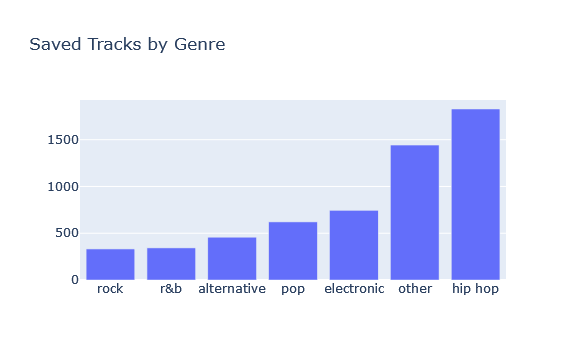

In [118]:
data = df.groupby(['main_genre'])['id'].count().reset_index().rename(columns={'id':'count'})
data = data.sort_values(by='count')
data.head()

fig = px.bar(data, x='main_genre', y='count', title=f'Saved Tracks by Genre ')
fig.update_layout(
    xaxis_title='',
    yaxis_title=''
)
fig.write_html(base_path + '/figures/saved_tracks_by_main_genre_bar.html')
py.plot(fig, filename="saved_tracks_by_main_genre_bar", auto_open=True)
fig.show()

In [119]:
data

,main_genre,count
6,rock,332
5,r&b,343
0,alternative,458
4,pop,621
1,electronic,745
3,other,1443
2,hip hop,1828


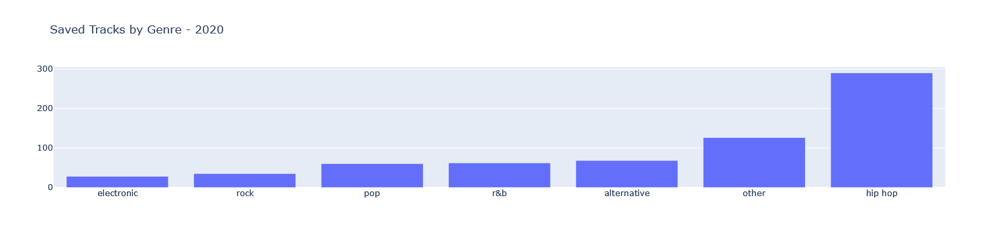

In [120]:
data = df.groupby(['year_added', 'main_genre'])['id'].count().reset_index().rename(columns={'id':'count'})

year = 2020
data = data[data['year_added']==year]
data = data.sort_values(by='count')
data.head()

fig = px.bar(data, x='main_genre', y='count', title=f'Saved Tracks by Genre - {year}')
fig.update_layout(
    xaxis_title='',
    yaxis_title=''
)
fig.write_html(base_path + f'/figures/saved_tracks_by_main_genre_{year}_bar.html')
fig.show()

We're now going to plot a radar chart for the 6 genres (and other), which will show the percentage of saved tracks for each. First, we'll create a dataframe suitable for `plotly_express.line_polar()` which we will use to plot the radar chart.

In [121]:
data = df.groupby(['year_added', 'main_genre'])['id'].count().reset_index().rename(columns={'id':'count'})
year_total = data.groupby('year_added')['count'].sum().reset_index().rename(columns={'count':'year_total'})
data = pd.merge(data, year_total, on='year_added')
data['%'] = round(100*(data['count']/data['year_total']), 2)
data.head()

,year_added,main_genre,count,year_total,%
0,2016,alternative,64,893,7.17
1,2016,electronic,89,893,9.97
2,2016,hip hop,468,893,52.41
3,2016,other,135,893,15.12
4,2016,pop,57,893,6.38


I've pivoted the table here for a clearer picture with `year_added` as the index and the 7 genre categories as the columns. The values are the percentage of tracks belonging to each genre, added that year. 

In [122]:
data.pivot(columns=['main_genre'], index='year_added', values='%')

main_genre,alternative,electronic,hip hop,other,pop,r&b,rock
year_added,,,,,,,
2016,7.17,9.97,52.41,15.12,6.38,4.93,4.03
2017,10.16,16.04,42.65,14.04,8.82,6.68,1.60
2018,5.96,18.10,30.02,28.97,6.90,5.02,5.02
2019,10.22,12.93,29.80,24.63,8.87,7.88,5.67
2020,10.16,4.19,43.35,18.83,8.97,9.27,5.23
2021,10.25,8.37,20.49,29.58,16.45,8.37,6.49
2022,3.98,18.41,9.95,43.53,14.93,1.24,7.96
2023,3.66,16.71,9.14,34.99,22.19,2.09,11.23
2024,4.21,15.89,2.34,40.19,19.16,1.87,16.36


We will pass the following parameters:
- `r='%'` - the radius of each line will be equal to the percentage of saved tracks
- `theta='main_genre'` - the categories around the circumference of the radar are the genres
- `color='year_added'` - the hue of each line is dictated by the year added

The diagram looks very busy with all years displayed at once. The interactive plot allows us to select / deselect years as desired. To ensure that all years aren't displayed when the plot is loaded, I've added this line of code which displays only the first and last years on rendering:

`fig.for_each_trace(lambda trace: trace.update(visible=True) if trace.legendgroup in [str(data['year_added'].min()), str(data['year_added'].max())] else (trace.update(visible="legendonly")))`

In [123]:
fig = px.line_polar(data, r='%', theta='main_genre', line_close=True, color='year_added', title=f'Saved Tracks by Genre (%)')

fig.update_layout(
    height=600,
    width=800, 
)

# Set the range of the radial axis to 0-100
fig.update_polars(radialaxis=dict(range=[0, 60]))

# only highlight first and last year by default
fig.for_each_trace(lambda trace: trace.update(visible=True) if trace.legendgroup in [str(data['year_added'].min()), str(data['year_added'].max())] else (trace.update(visible="legendonly")))

fig.write_html(base_path + '/figures/saved_tracks_by_main_genre_radar.html')
py.plot(fig, filename="saved_tracks_by_main_genre_radar", auto_open=True)
fig.show()

`plotly.subplots.make_subplots` can be used to display multiple subplots on one figure. Here, I've used `plotly.graph_objects.Scatterpolar` to plot a radar chart for each year.

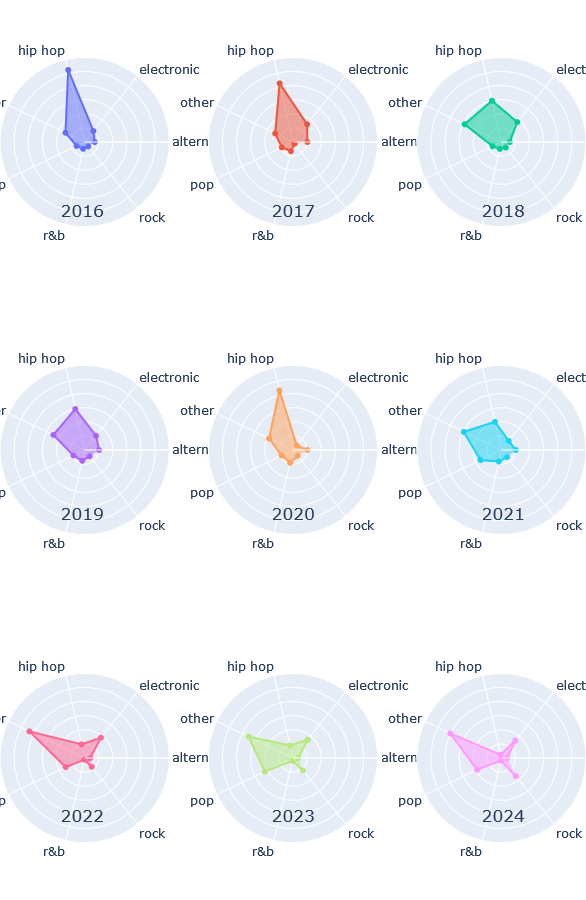

In [219]:
fig = make_subplots(rows=3, cols=3, specs=[[{'type': 'polar'}]*3]*3) #, subplot_titles=[str(year) for year in data.year_added.unique()])

axis_mapping = {
    0:{0:1, 1:1},
    1:{0:1, 1:2},
    2:{0:1, 1:3},
    3:{0:2, 1:1},
    4:{0:2, 1:2},
    5:{0:2, 1:3},
    6:{0:3, 1:1},
    7:{0:3, 1:2},
    8:{0:3, 1:3}
}

# add a radar chart to each subplot
for i, year in enumerate(data.year_added.unique()):
    yearly_data = data[data['year_added']==year]
    fig.add_trace(
        go.Scatterpolar(
            name=str(year),
            r=yearly_data['%'],
            theta=yearly_data['main_genre']
        ), axis_mapping[i][0], axis_mapping[i][1])

    
# fill in the area of each radar plot
fig.update_traces(fill='toself')

fig.update_layout(
    height=900,
    width=900, 
    margin=dict(l=0, r=0, t=30, b=30),
    showlegend=False,
)

# Update layout to hide the radial axis labels
for i in range(9):
    fig.update_layout({
        f'polar{i+1}': dict(
            radialaxis=dict(showticklabels=False)
        ),
        f'polar{i+1}.radialaxis': dict(range=[0, 60])
    })
    
# Manually add annotations for each subplot title
annotations = []
titles = [str(year) for year in data.year_added.unique()]
for i in range(9):
    row = 4-axis_mapping[i][0]
    col = axis_mapping[i][1]
    annotations.append(dict(
        x=0.5 * (col - 1) + (2 - col) * 0.14,
        y=0.5 * (row - 1) + (2 - row) * 0.14 - 0.09,
        text=titles[i] if i < len(titles) else '',
        showarrow=False,
        xanchor='center',
        yanchor='bottom',
        font=dict(size=17)
    ))

fig.update_layout(annotations=annotations)
fig.write_html(base_path + '/figures/saved_tracks_by_main_genre_all_years_subplots_radar.html')
py.plot(fig, filename="saved_tracks_by_main_genre_all_years_subplots_radar", auto_open=True)
fig.show()

In [220]:
column = 'main_genre'

long_df = get_cumulative_stats(df, column)
long_df.head()

,date_added,main_genre,cum_saved,%
0,2016-02-17,alternative,0,0.000
1,2016-02-18,alternative,1,20.000
2,2016-02-19,alternative,1,6.250
3,2016-02-20,alternative,1,4.000
4,2016-02-21,alternative,1,3.125


In [221]:
main_genres_bcr = get_bcr_df(long_df, name='main_genre')
main_genres_bcr.head()

main_genre,alternative,electronic,hip hop,other,pop,r&b,rock
date_added,,,,,,,
2016-02-29,4.0,10.0,57.0,3.0,10.0,3.0,0.0
2016-03-31,4.0,17.0,128.0,32.0,12.0,4.0,5.0
2016-04-30,17.0,44.0,175.0,44.0,18.0,10.0,10.0
2016-05-31,33.0,54.0,199.0,49.0,21.0,15.0,12.0
2016-06-30,35.0,61.0,218.0,59.0,23.0,19.0,12.0


In [59]:
plot_bar_chart_race(
    df=main_genres_bcr,
    filename=base_path + '/figures/main_genres_bcr.mp4',
    n_bars=8,
    title='Saved Tracks by Genre'
)

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:286: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:287: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



# 5. Artists

As before, we can generate a bar chart race animation, this time for artists.

In [222]:
column = 'artist_name'

long_df = get_cumulative_stats(df, column)
long_df.head()

,date_added,artist_name,cum_saved,%
0,2016-02-17,$kinny,0,0.0
1,2016-02-18,$kinny,0,0.0
2,2016-02-19,$kinny,0,0.0
3,2016-02-20,$kinny,0,0.0
4,2016-02-21,$kinny,0,0.0


In [223]:
artists_bcr = long_df.copy()
artists_bcr['artist_name'] = artists_bcr['artist_name'].str.replace(r'\$', 's', regex=True)

artists_bcr = get_bcr_df(artists_bcr, name='artist_name')
artists_bcr.head()

artist_name,&ME,(dc),2 Chainz,21 Savage,2Pac,40 Thieves,50 Cent,67,6LACK,808 State,808INK,9th Creation,9th Wonder,A Touch Of Class,A Tribe Called Quest,A.CHAL,ABRA,ABSOLUTE.,AC/DC,AJ Tracey,ALYSS,AVNU (UK),Aaron May,Aaron Unknown,Ab-Soul,AceMo,Acid Washed,Acidslop,Action Bronson,Actress,Adam Betts,Adam Beyer,Adam Snow,Addison Groove,Adele,Admas,Aesop Rock,Afriquoi,Against All Logic,Agar Agar,Aged In Harmony,Agnes,Agoria,Agua Re,Aim,Air,Akala,Al Bowlly,Al Dobson Jr.,Al Green,Al Zanders,Alan Fitzpatrick,Alannah Myles,Aleksandir,Alena Cherny,Alessi Brothers,Alex Banks,Alex Isley,Alex Wiley,Alfa Mist,Alicia Keys,Alisha Chinai,Alison Goldfrapp,Alison Limerick,Allen Toussaint,Alogte Oho & His Sounds of Joy,Alpay,Alps 2,Althea Forrest,Altin Gün,Alton McClain & Destiny,Aluna,AlunaGeorge,Ama Lou,Amaarae,Amadou & Mariam,Amadou Binta Konté,Amber Mark,Amber Olivier,Ambisonic,America,American Royalty,Amindi,Aminé,Ammi Boyz,Amp Fiddler,Amy Winehouse,Ananda Shankar,Anaïs Mitchell,Anderson .Paak,Andras,Andres,Andrew Ashong,Andy Hart,Angie Stone,Angèle,Anish Kumar,Ann Nesby,Ann Peebles,Ant Banks,Anthony Valadez,Anti Lilly,Antwon,Aphex Twin,Aquarian Dream,Ara Koufax,Archie Hamilton,Architechs,Archy Marshall,Arctic Monkeys,Ard Adz,Aretha Franklin,Argent,Ari Lennox,Ariel Pink,Arin Ray,Arlo Parks,Armand Van Helden,Aroop Roy,Arrested Development,Artful Dodger,AsAP Ferg,AsAP Mob,AsAP Rocky,Asake,Astrud Gilberto,AtariJones,Atoms For Peace,Attacca Pesante,Aubrey,Augustus Pablo,Auntie Flo,Avalon Emerson,Avelino,Awanto 3,Awon,Awon & Dephlow,Axel Boman,Ay Wing,Azizi Gibson,Azymuth,B-ahwe,B.B. King,BADBADNOTGOOD,BANKS,BICEP,BJ The Chicago Kid,BLOND:ISH,BROCKHAMPTON,BVBATZ,Baauer,Baba Stiltz,Babe Rainbow,Baby D,Baby Keem,Babyfather,Bacao Rhythm & Steel Band,Bachman-Turner Overdrive,Bad Company,Bajy,Baka Not Nice,Bakermat,Baltra,Bambino Prodigio,Barbara Jackson,Barbara Norris,Bardcore,Barrington Levy,Barry Adamson,Barry Can't Swim,Barry Walker Jr.,Barry White,Bas,Bash,Bastien Keb,Baxter Dury,Bearcubs,Bee Gees,Bella Boo,Bellaire,Benga,Benjamin Fröhlich,Benny Latimore,Benny Rodrigues,Benny The Butcher,Bernie Worrell,Beshken,Best Coast,Beverlay,Beyoncé,Bibi Flash,Big L,Big Sean,Big Zuu,Biig Piig,Bileo,Bill Withers,Billie Eilish,Billie Marten,Billy Boyo,Billy Davis,Billy Joel,Billy Ocean,Billy Paul,Bishop Nehru,Biz Markie,Björk,Bklava,Black Booby,Black Box,Black Coffee,Black Eyed Peas,Black Hippy,Black Josh,Black Loops,Black Milk,Black Sheep,Black Star,Black The Ripper,Black Thought,Blak Beat Niks,BlazeYL,Blended Babies,Blind Mic,Bloc Party,BlocBoy JB,Blonde Redhead,Blondie,Blood Orange,Blu,Blue In Green,Blue Iverson,Blue Room Mafia,Blue Öyster Cult,Blur,Boards of Canada,Bob Holroyd,Bob James,Bobbi Humphrey,"Bobby ""Blue"" Bland",Bobby Caldwell,Bobby D'Ambrosio,Bobby Raps,Bodhi,Bomfunk MC's,Boncana Maïga,Bone Thugs-N-Harmony,Boney M.,Bonkaz,Bonobo,Booker T.,Booker T. & the M.G.'s,Boom Clap Bachelors,Bootsy Collins,Borai,Borai & Denham Audio,Boris Brejcha,Boris Werner,Boxed In,Boys Noize,Brame & Hamo,Brandy,Branko,Brassroots,Break,Breaka,Brent Faiyaz,Brian Ellis,Brian Fresco,Brilliantes Del Vuelo,Brock Berrigan,Bryson Tiller,Bullion,Burial,Burna Boy,Burnis Moleme,Busta Rhymes,Buttechno,Byron the Aquarius,Béla Bartók,Bô'vel,CASISDEAD,CEONRPG,CHIC,CHISEKO,CJ Fly,CJay,CTEPEO '57,CZARFACE,Cadell,Cadenza,Caleborate,Calibre,Calvin Harris,Calÿpso,Camarão Orkestra,Cameo Blush,Candi Staton,Capinera,Caribou,Carlton Williams,Carly Simon,Carmen,Caroline Polachek,Carpenters,Carrie Lucas,Carthago,Casanova,Casper Caan,Cassiano,Cassie,Cassio Kohl,Cassius,CeCe Peniston,CeCe Rogers,Central Line,Cerrone,Chaka Khan,Chali 2na,Chance the Rapper,Change,Channel Tres,Chaos In The CBD,Chappell Roan,Charles Bradley,Charles Murdoch,Charlotte Day Wilson,Charlotte Dos Santos,Chase & Status,Che Lingo,Chemise,Cheryl Lynn,Chesus,Chicco,Chico Hamilton,Chief Keef,Childish Gambino,Childish Major,Chilly Gonzales,Chinese Man,Chip,Chiwoniso,Chris Brown,Chris Lorenzo,Chrishan,Christian Rich,Chromatics

In [58]:
plot_bar_chart_race(
    df=artists_bcr,
    filename=base_path + '/figures/artists_bcr.mp4',
    n_bars=8,
    title='Saved Tracks by Artist'
)

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 127 () missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 128 (\x80) missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 129 (\x81) missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 130 (\x82) missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/

### Unique Artists

As well as new tracks, we can explore when new artists were added to our library.

In [224]:
unique_artists = df.sort_values(by='date_added')
unique_artists = unique_artists.drop_duplicates(subset='artist_name', keep='first')
unique_artists.head()

,id,name,popularity,is_local,is_explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,date_added,year_added,month_added,month_index,day_of_week_added,day_of_week_index,time_added,duration_s,duration_min,album_id,album_name,album_popularity,album_release_date,album_release_date_precision,artist_id,artist_name,artist_popularity,2-step,abstract,abstract beats,abstract hip hop,acid house,acid jazz,acid rock,acid techno,acousmatic,acoustic blues,adult standards,african electronic,african percussion,afro house,afro psych,afro r&b,afro soul,afro-cuban percussion,afro-funk,afrobeat,afrobeat brasileiro,afrobeat fusion,afrobeats,afrofuturism,afrofuturismo brasileiro,afropop,afroswing,alabama indie,alabama rap,album rock,alternative,alternative americana,alternative dance,alternative hip hop,alternative metal,alternative pop rock,alternative r&b,alternative rock,ambient,ambient country,ambient house,ambient idm,ambient pop,ambient techno,american contemporary classical,arab alternative,arab groove,arabic hip hop,argentine rock,arkansas country,armenian hip hop,art pop,art punk,art rock,atl hip hop,atl trap,auckland indie,aussie drill,aussietronica,australian alternative rock,australian ambient,australian dance,australian electropop,australian experimental,australian hip hop,australian house,australian indie,australian indie rock,australian pop,australian psych,australian r&b,australian reggae fusion,australian rock,australian surf rock,australian trap,austrian dnb,avant-garde jazz,azonto,azontobeats,balearic,barbadian pop,bardcore,baroque pop,bass house,bass trap,bass trip,bath indie,bay area indie,bboy,beach music,beatlesque,bebop,bedroom pop,bedroom soul,belgian edm,belgian hip hop,belgian pop,belly dance,benga,berlin school,big beat,birmingham grime,birmingham hip hop,birmingham indie,birmingham metal,black comedy,black punk,bleep techno,blues,blues rock,bmore,bolero,boogaloo,boogie,boom bap,boom bap espanol,bossa nova,bossa nova jazz,boston hip hop,boston rock,boy band,braindance,brass band,brass band pop,brazilian boogie,brazilian jazz,brazilian soul,breakbeat,breaks,brill building pop,bristol electronic,brit funk,british alternative rock,british blues,british comedy,british dance band,british experimental,british invasion,british jazz,british math rock,british singer-songwriter,british soul,britpop,broken beat,bronx hip hop,brooklyn drill,brooklyn indie,brostep,bubble trance,bubblegum pop,buffalo hip hop,bulgarian electronic,cali rap,calypso,cambodian rock,canadian americana,canadian comedy,canadian contemporary country,canadian contemporary r&b,canadian country,canadian electronic,canadian electropop,canadian hip hop,canadian house,canadian indigenous hip hop,canadian indigenous music,canadian latin,canadian modern jazz,canadian pop,canadian singer-songwriter,canadian trap,candy pop,canterbury scene,canzone d'autore,cascadia psych,chamber pop,chamber psych,channel islands indie,chanson,chicago blues,chicago bop,chicago drill,chicago house,chicago rap,chicago soul,chicha,chill abstract hip hop,chill baile,chill drill,chill r&b,chillhop,chillwave,chimurenga,cincinnati rap,city pop,classic afrobeat,classic bollywood,classic canadian rock,classic city pop,classic country pop,classic dubstep,classic garage rock,classic girl group,classic house,classic italian pop,classic japanese jazz,classic polish pop,classic portuguese pop,classic progressive house,classic rock,classic soul,classic turkish pop,classic uk pop,classical,cloud rap,collage pop,colombian pop,comedy,complextro,compositional ambient,conscious hip hop,contemporary classical,contemporary country,contemporary jazz,contemporary post-bop,contemporary r&b,cool jazz,cosmic american,country,country dawn,country rock,crank wave,cumbia funk,dance pop,dance rock,dance-punk,dancefloor dnb,dancehall,dancehall queen,danish electronic,danish indie pop,danish modern jazz,danish techno,dark disco,dark plugg,dark techno,dark trap,dec

In [225]:
unique_artist_counts = unique_artists.groupby('date_added')['artist_name'].count().reset_index().rename(columns={'artist_name':'new_artists'})
unique_artist_counts['cum_artists'] = unique_artist_counts['new_artists'].cumsum()
unique_artist_counts.head()

,date_added,new_artists,cum_artists
0,2016-02-17,2,2
1,2016-02-18,1,3
2,2016-02-19,6,9
3,2016-02-20,3,12
4,2016-02-21,3,15


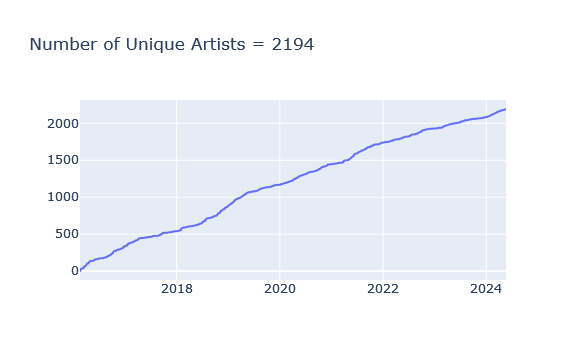

In [226]:
fig = px.line(
    unique_artist_counts,
    x='date_added',
    y='cum_artists',
    title=f"Number of Unique Artists = {unique_artist_counts['cum_artists'].max()}"
)
fig.update_layout(
    xaxis_title='',
    yaxis_title=''
)
fig.write_html(base_path + '/figures/unique_artists_line.html')
py.plot(fig, filename="unique_artists_line", auto_open=True)
fig.show()

Similar to the tracks by genre plots, we can plot unique artists by genre.

In [227]:
# Melt the DataFrame
genre_df = pd.melt(unique_artists, id_vars=['id', 'date_added'], value_vars=genres, var_name='genre', value_name='is_genre')
genre_df = genre_df[genre_df['is_genre'] == 1]
genre_df = genre_df.drop(columns=['is_genre'])
genre_df = genre_df.reset_index(drop=True)

genre_df.head()

,id,date_added,genre
0,2va1wxQAeJ0oGAN0mPD96f,2016-03-17,2-step
1,1AqlUjWgtEhvosGapJmfnL,2016-03-17,2-step
2,5R3PpVbhR0p3B48dQAHXB9,2016-03-17,2-step
3,7c8RMe4a29gUgMny30CNG8,2017-03-12,2-step
4,686HRftCfiFaLfitodtEsx,2018-10-22,2-step


In [228]:
column = 'genre'

long_df = get_cumulative_stats(genre_df, column)
long_df.head()

,date_added,genre,cum_saved,%
0,2016-02-17,2-step,0,0.0
1,2016-02-18,2-step,0,0.0
2,2016-02-19,2-step,0,0.0
3,2016-02-20,2-step,0,0.0
4,2016-02-21,2-step,0,0.0


In [229]:
unique_artists_by_genre_bcr = get_bcr_df(long_df, name='genre')
unique_artists_by_genre_bcr.head()

genre,2-step,abstract,abstract beats,abstract hip hop,acid house,acid jazz,acid rock,acid techno,acousmatic,acoustic blues,adult standards,african electronic,african percussion,afro house,afro psych,afro r&b,afro soul,afro-cuban percussion,afro-funk,afrobeat,afrobeat brasileiro,afrobeat fusion,afrobeats,afrofuturism,afrofuturismo brasileiro,afropop,afroswing,alabama indie,alabama rap,album rock,alternative,alternative americana,alternative dance,alternative hip hop,alternative metal,alternative pop rock,alternative r&b,alternative rock,ambient,ambient country,ambient house,ambient idm,ambient pop,ambient techno,american contemporary classical,arab alternative,arab groove,arabic hip hop,argentine rock,arkansas country,armenian hip hop,art pop,art punk,art rock,atl hip hop,atl trap,auckland indie,aussie drill,aussietronica,australian alternative rock,australian ambient,australian dance,australian electropop,australian experimental,australian hip hop,australian house,australian indie,australian indie rock,australian pop,australian psych,australian r&b,australian reggae fusion,australian rock,australian surf rock,australian trap,austrian dnb,avant-garde jazz,azonto,azontobeats,balearic,barbadian pop,bardcore,baroque pop,bass house,bass trap,bass trip,bath indie,bay area indie,bboy,beach music,beatlesque,bebop,bedroom pop,bedroom soul,belgian edm,belgian hip hop,belgian pop,belly dance,benga,berlin school,big beat,birmingham grime,birmingham hip hop,birmingham indie,birmingham metal,black comedy,black punk,bleep techno,blues,blues rock,bmore,bolero,boogaloo,boogie,boom bap,boom bap espanol,bossa nova,bossa nova jazz,boston hip hop,boston rock,boy band,braindance,brass band,brass band pop,brazilian boogie,brazilian jazz,brazilian soul,breakbeat,breaks,brill building pop,bristol electronic,brit funk,british alternative rock,british blues,british comedy,british dance band,british experimental,british invasion,british jazz,british math rock,british singer-songwriter,british soul,britpop,broken beat,bronx hip hop,brooklyn drill,brooklyn indie,brostep,bubble trance,bubblegum pop,buffalo hip hop,bulgarian electronic,cali rap,calypso,cambodian rock,canadian americana,canadian comedy,canadian contemporary country,canadian contemporary r&b,canadian country,canadian electronic,canadian electropop,canadian hip hop,canadian house,canadian indigenous hip hop,canadian indigenous music,canadian latin,canadian modern jazz,canadian pop,canadian singer-songwriter,canadian trap,candy pop,canterbury scene,canzone d'autore,cascadia psych,chamber pop,chamber psych,channel islands indie,chanson,chicago blues,chicago bop,chicago drill,chicago house,chicago rap,chicago soul,chicha,chill abstract hip hop,chill baile,chill drill,chill r&b,chillhop,chillwave,chimurenga,cincinnati rap,city pop,classic afrobeat,classic bollywood,classic canadian rock,classic city pop,classic country pop,classic dubstep,classic garage rock,classic girl group,classic house,classic italian pop,classic japanese jazz,classic polish pop,classic portuguese pop,classic progressive house,classic rock,classic soul,classic turkish pop,classic uk pop,classical,cloud rap,collage pop,colombian pop,comedy,complextro,compositional ambient,conscious hip hop,contemporary classical,contemporary country,contemporary jazz,contemporary post-bop,contemporary r&b,cool jazz,cosmic american,country,country dawn,country rock,crank wave,cumbia funk,dance pop,dance rock,dance-punk,dancefloor dnb,dancehall,dancehall queen,danish electronic,danish indie pop,danish modern jazz,danish techno,dark disco,dark plugg,dark techno,dark trap,deconstructed club,deep disco,deep disco house,deep euro house,deep funk,deep funk house,deep house,deep idm,deep liquid bass,deep minimal techno,deep soul house,deep tech house,deep techno,deep underground hip hop,delta blues,denton tx indie,desert blues,destroy techno,detroit hip hop,detroit house,detroit rock,detroit techno,dfw rap,dirty south rap,disco,disco house,diva house,d

In [66]:
plot_bar_chart_race(
    df=unique_artists_by_genre_bcr,
    filename=base_path + '/figures/unique_artists_by_genre_bcr.mp4',
    n_bars=8,
    title='Unique Artists by Genre'
)

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:889: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 127 () missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 128 (\x80) missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 129 (\x81) missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/_make_chart.py:284: UserWarning:

Glyph 130 (\x82) missing from font(s) DejaVu Sans.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/bar_chart_race/

# 6. Popularity

Using `plotly.graph_objects.Violin` we can plot multiple ridgeline plots (one for each year) on the same figure. Each plot shows the distribution of track popularity. Since 2016, I've tended to add more popular tracks to my library.

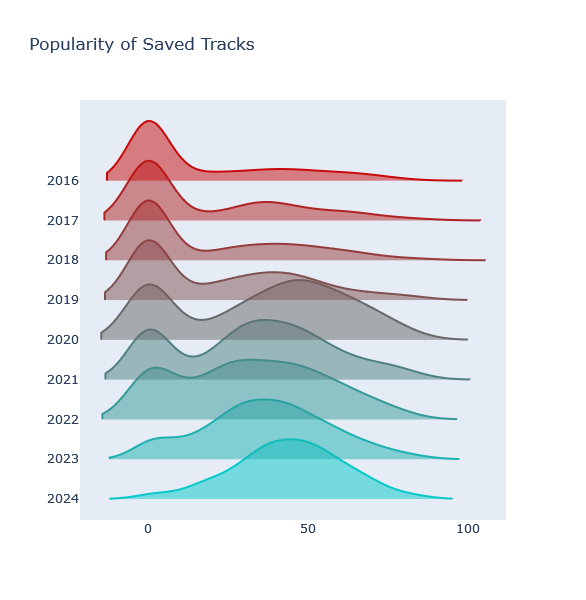

In [230]:
colors = n_colors('rgb(5, 200, 200)', 'rgb(200, 10, 10)', len(df['year_added'].unique()), colortype='rgb')

fig = go.Figure()
for year, color in zip(df['year_added'].unique(), colors):
    fig.add_trace(go.Violin(x=np.array(df[df['year_added']==year]['popularity']), line_color=color, name=str(year)))

fig.update_traces(orientation='h', side='positive', width=3, points=False)
fig.update_layout(
    title='Popularity of Saved Tracks',
    xaxis_showgrid=False,
    xaxis_zeroline=False,
    showlegend=False,
    height=600,
    width=1000
)
fig.write_html(base_path + '/figures/popularity_ridge.html')
py.plot(fig, filename="popularity_ridge", auto_open=True)
fig.show()

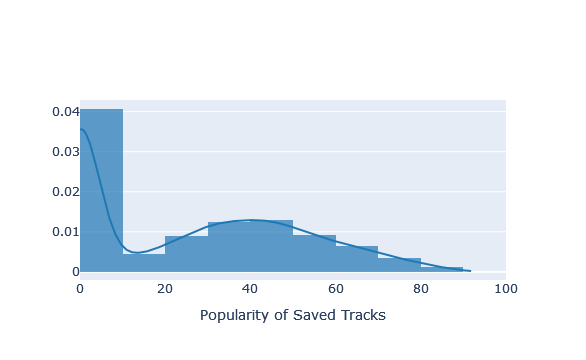

In [231]:
data = [df['popularity'].values]
group_labels = ['popularity']

fig = ff.create_distplot(data, group_labels, bin_size=10, show_hist=True, curve_type='kde', show_rug=False)

fig.update_xaxes(
    title_text='Popularity of Saved Tracks',
)

fig.update_layout(showlegend=False)

for trace in fig.data:
    trace.hoverinfo = 'none'
fig.write_html(base_path + '/figures/popularity_dist.html')
py.plot(fig, filename="popularity_dist", auto_open=True)
fig.show()

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/seaborn/categorical.py:3399: UserWarning:

33.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.



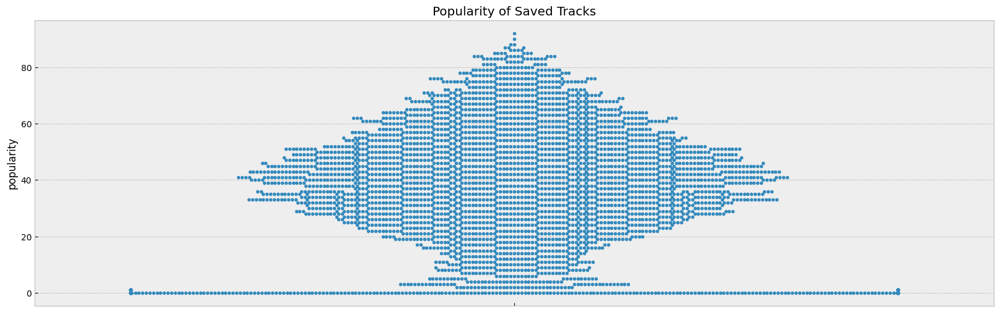

In [69]:
fig, ax = plt.subplots(figsize=(20,6))
sns.swarmplot(y=df['popularity'], size=4)
ax.set_title('Popularity of Saved Tracks')
fig.savefig(base_path + '/figures/popularity_swarm.png')

# 7. Tempo

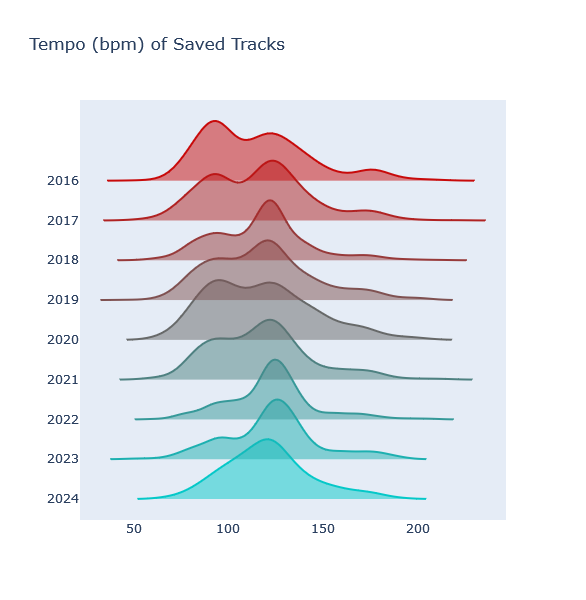

In [232]:
colors = n_colors('rgb(5, 200, 200)', 'rgb(200, 10, 10)', len(df['year_added'].unique()), colortype='rgb')

fig = go.Figure()
for year, color in zip(df['year_added'].unique(), colors):
    fig.add_trace(go.Violin(x=np.array(df[df['year_added']==year]['tempo']), line_color=color, name=str(year)))

fig.update_traces(orientation='h', side='positive', width=3, points=False)
fig.update_layout(
    title='Tempo (bpm) of Saved Tracks',
    xaxis_showgrid=False,
    xaxis_zeroline=False,
    showlegend=False,
    height=600,
    width=1000
)
fig.write_html(base_path + '/figures/tempo_ridge.html')
py.plot(fig, filename="tempo_ridge", auto_open=True)
fig.show()

In [233]:
data = [df['tempo'].values]
group_labels = ['tempo']

fig = ff.create_distplot(data, group_labels, bin_size=10, show_hist=True, curve_type='kde', show_rug=False)

fig.update_xaxes(
    title_text='Tempo (bpm) of Saved Tracks',
)

fig.update_layout(showlegend=False)

for trace in fig.data:
    trace.hoverinfo = 'none'
fig.write_html(base_path + '/figures/tempo_dist.html')
py.plot(fig, filename="tempo_dist", auto_open=True)
fig.show()

`seaborn.swarmplot` can be used to produce a swarm plot of track tempos. We can see that a large proportion of my tracks sit in the 120-130 bpm range. The second largest group lies in the 90-100 bpm range.

/home/bartek/anaconda3/envs/spotify_env/lib/python3.10/site-packages/seaborn/categorical.py:3399: UserWarning:

5.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.



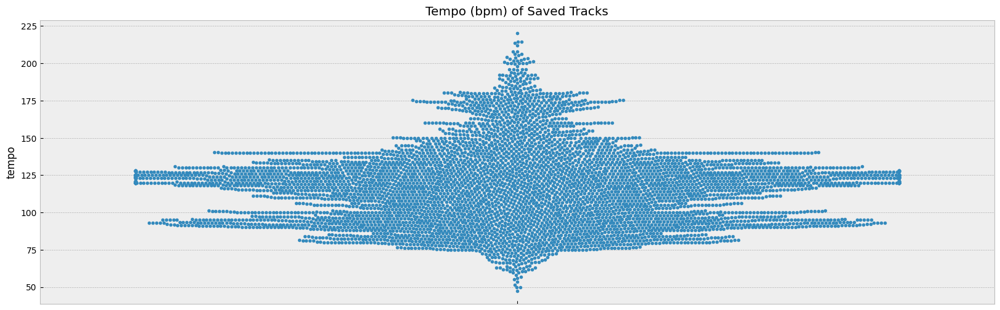

In [72]:
fig, ax = plt.subplots(figsize=(20,6))
sns.swarmplot(y=df['tempo'], size=4)
ax.set_title('Tempo (bpm) of Saved Tracks')
fig.savefig(base_path + '/figures/tempo_swarm.png')

# 8. Audio Features

In [234]:
audio_features = [
    'danceability',
    'energy',
    'speechiness',
    'acousticness',
    'instrumentalness',
    'liveness',
    'valence'
]

In [235]:
data = df.groupby('year_added')[audio_features].mean().reset_index()
data

,year_added,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence
0,2016,0.661406,0.655687,0.190670,0.188125,0.103247,0.206330,0.516027
1,2017,0.660447,0.638828,0.174849,0.241313,0.178554,0.207637,0.489243
2,2018,0.689478,0.639656,0.132563,0.195255,0.283139,0.177643,0.521791
3,2019,0.672884,0.622017,0.163918,0.250164,0.199820,0.190033,0.503643
4,2020,0.688903,0.640970,0.167170,0.218361,0.122289,0.195823,0.550102
5,2021,0.669551,0.635440,0.126095,0.233172,0.198914,0.177108,0.569360
6,2022,0.674286,0.689705,0.085170,0.187109,0.354341,0.188251,0.548856
7,2023,0.639822,0.641954,0.077244,0.268078,0.351501,0.167313,0.524176
8,2024,0.633238,0.637106,0.070340,0.273777,0.262056,0.177015,0.560746


In [236]:
data = data.reset_index().melt(id_vars='year_added', value_vars=audio_features)
data.head()

,year_added,variable,value
0,2016,danceability,0.661406
1,2017,danceability,0.660447
2,2018,danceability,0.689478
3,2019,danceability,0.672884
4,2020,danceability,0.688903


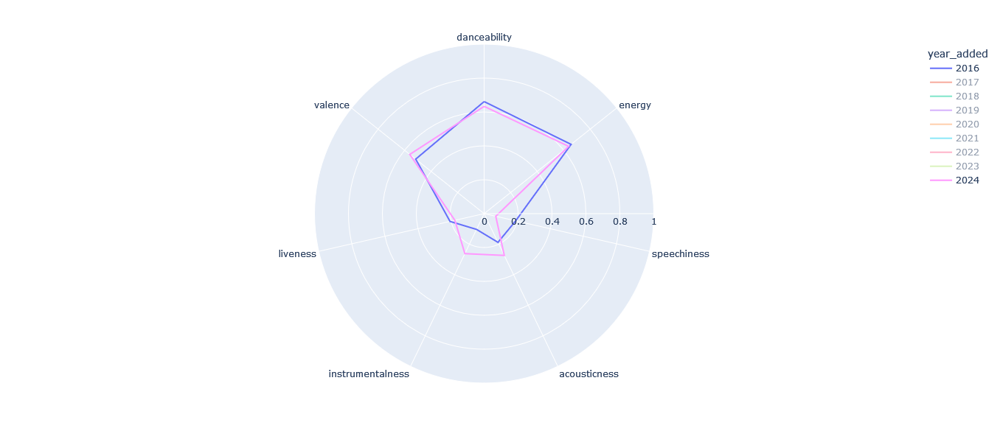

In [237]:
fig = px.line_polar(data, r='value', theta='variable', line_close=True, color='year_added')

fig.update_layout(
    height=600,
    width=800
)

# Set the range of the radial axis to 0-1
fig.update_polars(radialaxis=dict(range=[0, 1]))

# only highlight first and last year by default
fig.for_each_trace(lambda trace: trace.update(visible=True) if trace.legendgroup in [str(data['year_added'].min()), str(data['year_added'].max())] else (trace.update(visible="legendonly")))
fig.write_html(base_path + '/figures/audio_features_radar.html')
py.plot(fig, filename="audio_features_radar", auto_open=True)
fig.show()

In [239]:
data = df.melt(id_vars='id', value_vars=audio_features).drop(columns='id').rename(columns={'variable':'audio_feature'})
data.head()

,audio_feature,value
0,danceability,0.763
1,danceability,0.594
2,danceability,0.607
3,danceability,0.523
4,danceability,0.471


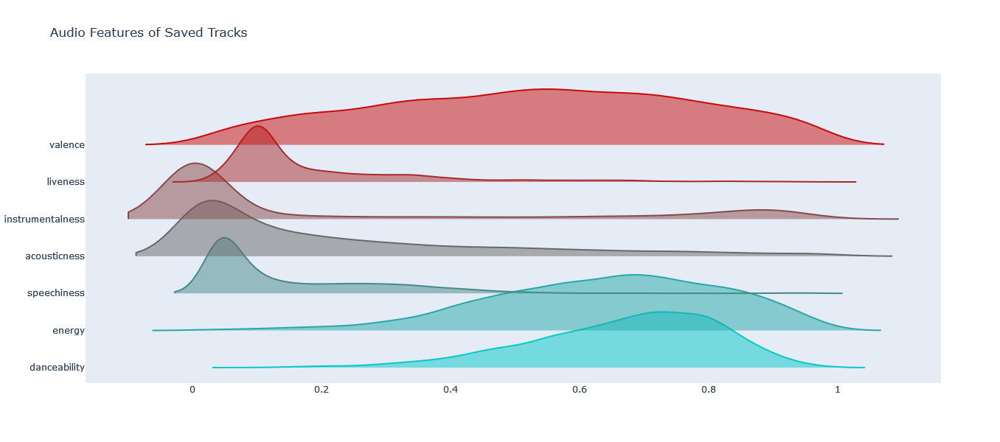

In [240]:
colors = n_colors('rgb(5, 200, 200)', 'rgb(200, 10, 10)', len(data['audio_feature'].unique()), colortype='rgb')

fig = go.Figure()
for feature, color in zip(data['audio_feature'].unique(), colors):
    fig.add_trace(go.Violin(x=np.array(data[data['audio_feature']==feature]['value']), line_color=color, name=str(feature)))

fig.update_traces(orientation='h', side='positive', width=3, points=False)
fig.update_layout(
    title='Audio Features of Saved Tracks',
    xaxis_showgrid=False,
    xaxis_zeroline=False,
    showlegend=False,
    height=600,
    width=1000
)
fig.write_html(base_path + '/figures/audio_features_ridge.html')
py.plot(fig, filename="audio_features_ridge", auto_open=True)
fig.show()